# Car Price Classification

*В данной работе необходимо предсказать ценовую категорию автомобиля (высокая, средняя, низкая). Датасет предоставлен Skillbox.*

## Содержание <a class="anchor" id="0"></a>

1. [Описание признаков](#1)
2. [Импорты библиотек](#2)
3. [Загрузка и исследование датасета](#3)
4. [Подготовка данных](#4)
   - 4.1 [Очистка данных](#4.1)
   - 4.2 [Заполнение пропусков](#4.2)
   - 4.3 [Устранение выбросов](#4.3)
   - 4.4 [Создание новых признаков](#4.4)
5. [Моделирование](#5)
   - 5.1 [Логистическая регрессия](#5.1)
   - 5.2 [Случайный лес](#5.2)
   - 5.3 [Многослойный персептрон](#5.3)
6. [Заключение](#6)

## 1. Описание признаков <a class="anchor" id="1"></a>

[Наверх](#0)

1) **id**: *идентификатор записи*
2) **url**: *URL-записи о продаже*
3) **region**: *регион*
4) **region_url**: *URL региона*
5) **price**: *стоимость*
6) **year**: *год выпуска*
7) **manufacturer**: *производитель*
8) **model**: *модель*
9) **condition**: *состояние*
10) **cylinders**: *количество цилиндров*
11) **fuel**: *тип топлива*
12) **odometer**: *количество пройденных миль*
13) **title_status**: *статус*
14) **transmission**: *коробка передач*
15) **VIN**: *идентификационный номер*
16) **drive**: *тип привода*
17) **size**: *размер*
18) **type**: *кузов*
19) **paint_color**: *цвет*
20) **image_url**: *URL изображения*
21) **description**: *указанное описание*
22) **county**: *страна*
23) **state**: *штат*
24) **lat**: *широта*
25) **long**: *долгота*
26) **posting_date**: *дата размещения объявления о продаже*
27) **price_category**: *категория цены*

## 2. Импорты библиотек <a class="anchor" id="2"></a>

[Наверх](#0)

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split, cross_val_score
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import OneHotEncoder, StandardScaler

import warnings
warnings.filterwarnings('ignore')

## 3. Загрузка и исследование датасета <a class="anchor" id="3"></a>

[Наверх](#0)

In [2]:
# Загружаем данные
df = pd.read_csv('data/vehicles_dataset.csv', sep=',')
df.head()

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,...,type,paint_color,image_url,description,county,state,lat,long,posting_date,price_category
0,7308295377,https://chattanooga.craigslist.org/ctd/d/chatt...,chattanooga,https://chattanooga.craigslist.org,54990,2020.0,ram,2500 crew cab big horn,good,NaN,...,pickup,silver,https://images.craigslist.org/00N0N_1xMPvfxRAI...,Carvana is the safer way to buy a car During t...,NaN,tn,35.060000,-85.250000,2021-04-17T12:30:50-0400,high
1,7316380095,https://newjersey.craigslist.org/ctd/d/carlsta...,north jersey,https://newjersey.craigslist.org,16942,2016.0,ford,explorer 4wd 4dr xlt,NaN,6 cylinders,...,SUV,black,https://images.craigslist.org/00x0x_26jl9F0cnL...,***Call Us for more information at: 201-635-14...,NaN,nj,40.821805,-74.061962,2021-05-03T15:40:21-0400,medium
2,7313733749,https://reno.craigslist.org/ctd/d/atlanta-2017...,reno / tahoe,https://reno.craigslist.org,35590,2017.0,volkswagen,golf r hatchback,good,NaN,...,sedan,NaN,https://images.craigslist.org/00y0y_eeZjWeiSfb...,Carvana is the safer way to buy a car During t...,NaN,ca,33.779214,-84.411811,2021-04-28T03:52:20-0700,high
3,7308210929,https://fayetteville.craigslist.org/ctd/d/rale...,fayetteville,https://fayetteville.craigslist.org,14500,2013.0,toyota,rav4,NaN,NaN,...,wagon,white,https://images.craigslist.org/00606_iGe5iXidib...,2013 Toyota RAV4 XLE 4dr SUV Offered by: R...,NaN,nc,35.715954,-78.655304,2021-04-17T10:08:57-0400,medium
4,7316474668,https://newyork.craigslist.org/lgi/cto/d/baldw...,new york city,https://newyork.craigslist.org,21800,2021.0,nissan,altima,new,4 cylinders,...,NaN,NaN,https://images.craigslist.org/00V0V_3pSOiPZ3Sd...,2021 Nissan Altima Sv with Only 8 K Miles Titl...,NaN,ny,40.654800,-73.609700,2021-05-03T18:32:06-0400,medium


In [3]:
df.shape

(10050, 27)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10050 entries, 0 to 10049
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              10050 non-null  int64  
 1   url             10050 non-null  object 
 2   region          10050 non-null  object 
 3   region_url      10050 non-null  object 
 4   price           10050 non-null  int64  
 5   year            10014 non-null  float64
 6   manufacturer    9665 non-null   object 
 7   model           9921 non-null   object 
 8   condition       6268 non-null   object 
 9   cylinders       5953 non-null   object 
 10  fuel            9987 non-null   object 
 11  odometer        10007 non-null  float64
 12  title_status    9884 non-null   object 
 13  transmission    10005 non-null  object 
 14  VIN             6086 non-null   object 
 15  drive           7026 non-null   object 
 16  size            2825 non-null   object 
 17  type            7845 non-null  

Как видно, в столбцах присутствуют пропущенные значения. Посчитаем их

In [5]:
miss_val = (df.isna().sum()/df.shape[0]*100).sort_values(ascending=False)
miss_val[miss_val>0]

county          100.000000
size             71.890547
cylinders        40.766169
VIN              39.442786
condition        37.631841
drive            30.089552
paint_color      29.482587
type             21.940299
manufacturer      3.830846
title_status      1.651741
model             1.283582
long              0.985075
lat               0.985075
fuel              0.626866
transmission      0.447761
odometer          0.427861
year              0.358209
posting_date      0.019900
image_url         0.019900
description       0.019900
dtype: float64

Видим есть признаки с довольно большим числом пропусков

In [6]:
# Статистика по категориальным переменным
df.describe(exclude=[int,float]).T

,count,unique,top,freq
url,10050,10000,https://roswell.craigslist.org/cto/d/artesia-1...,2
region,10050,393,"kansas city, MO",86
region_url,10050,405,https://kansascity.craigslist.org,86
manufacturer,9665,39,ford,1647
model,9921,3466,f-150,151
condition,6268,6,good,3134
cylinders,5953,8,6 cylinders,2288
fuel,9987,5,gas,8447
title_status,9884,6,clean,9568
transmission,10005,3,automatic,7737


Что можно увидеть по этим данным:
- в датасете 39 производителей автомобилей и самый массовый это Ford (1647 автомобилей);
- наиболее частая модель F-150 производства Ford (151 автомобиль);
- более 80 % автомобилей бензиновые;
- большинство автомобилей с автоматической трансмиссией (примерно 77 %);
- большинство автомобилей полноприводные (30 %);
- самый массовый тип это седаны;
- самый частый цвет - белый;
- большинство автомобилей высокой ценовой категории (более 30 %).

In [7]:
# Статистика по числовым переменным
df.describe()

,id,price,year,odometer,county,lat,long
count,1.005000e+04,1.005000e+04,10014.000000,1.000700e+04,0.0,9951.000000,9951.000000
mean,7.311544e+09,2.068429e+04,2010.917815,9.565719e+04,NaN,38.590164,-94.161564
std,4.475414e+06,1.243216e+05,9.697849,8.657948e+04,NaN,5.844756,18.123096
min,7.208550e+09,5.000000e+02,1915.000000,0.000000e+00,NaN,-67.144243,-158.069300
25%,7.308193e+09,7.900000e+03,2008.000000,3.899450e+04,NaN,34.830000,-110.447150
50%,7.312756e+09,1.574950e+04,2013.000000,8.837700e+04,NaN,39.285100,-87.999100
75%,7.315275e+09,2.799000e+04,2017.000000,1.370000e+05,NaN,42.427590,-80.830000
max,7.317090e+09,1.234568e+07,2022.000000,3.245000e+06,NaN,64.947500,173.885502


Что можно увидеть по этим данным:
- средняя цена автомобилей 20 тыс. долларов, медианная - 15 тыс. долларов;
- средний год производства автомобилей 2010-й, медианный - 2013-й;
- средний и медианный пробег примерно 90 тыс. км.

Рассмотрим распределение численных признаков

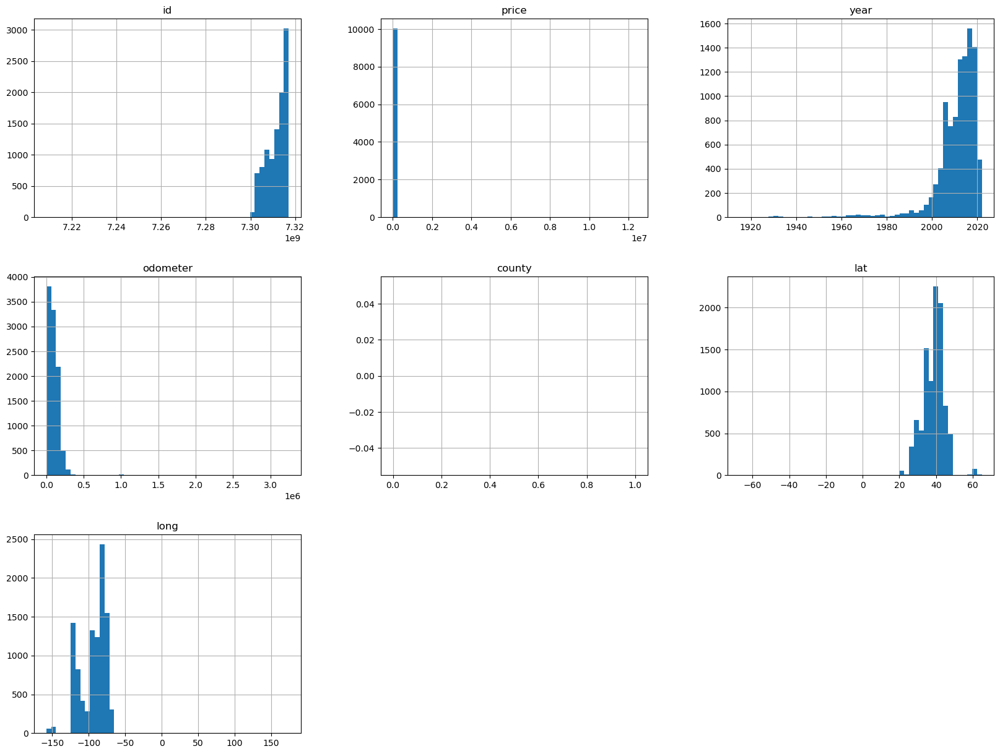

In [8]:
df.hist(bins=50, figsize=(20,15));

Сложно оценить, насколько эти распределения нормальные, так как у всех признаков есть сильные выбросы

## 4. Подготовка данных (Data Preparation) <a class="anchor" id="4"></a>

### 4.1 Очистка данных (Data Cleaning) <a class="anchor" id="4.1"></a>

[Наверх](#0)

Проверим, есть ли дубликаты

In [9]:
print("Количество дубликатов =", df.duplicated().sum())

Количество дубликатов = 50


In [10]:
# Удалим дубликаты
df = df.drop_duplicates()
df.shape

(10000, 27)

Удалим столбцы, в которых пропущенных значений больше 20 %

In [11]:
df = df.drop(miss_val[miss_val>20].index, axis=1).copy()
df.shape

(10000, 19)

Так как пробег и год выпуска автомобиля могут сильно влиять на цену, удалим строки, в которых эти значения пропущены

In [12]:
print('Количество пропусков в "year" и "odometer" =', (df.year.isna() | df.odometer.isna()).sum())

Количество пропусков в "year" и "odometer" = 77


Удалим строки в которых пропущены значения в **year** и **odometer**

In [13]:
df = df.dropna(subset=['year', 'odometer'])
df.shape

(9923, 19)

Преобразуем данные **odometer** и **year** из float в целочисленный формат int

In [14]:
df.odometer = df.odometer.astype(int)
df.year = df.year.astype(int)

У нас есть признак **posting_date** с типом данных object. Преобразуем данный признак в объект datetime

In [15]:
df.posting_date = pd.to_datetime(df.posting_date, utc=True)
df.posting_date.dtype

datetime64[ns, UTC]

На основе признака **posting_date** создадим ещё несколько признаков

In [16]:
# Создадим переменную month, обозначающую номер месяца подачи объявления
df['month'] = df.posting_date.dt.month.astype(int)

# Создадим переменную dayofweek, обозначающую день недели размещения объявления
df['dayofweek'] = df.posting_date.dt.weekday.astype(int)

# Создадим переменную age, обозначающую возраст автомобиля на момент подачи заявления
df['age'] = df.posting_date.dt.year - df.year

Удалим признак **posting_date**, а также признаки **id**, **url**, **region_url** и **image_url**, так как они, в данном случае, не несут для нас никакой полезной информации. Удалим так же признак **price**, так как он может спровоцировать утечку данных

In [17]:
df = df.drop(['id', 'price', 'posting_date', 'url', 'region_url', 'image_url'], axis=1)

Ещё раз посмотрим на данные

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9923 entries, 0 to 10049
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   region          9923 non-null   object 
 1   year            9923 non-null   int32  
 2   manufacturer    9579 non-null   object 
 3   model           9797 non-null   object 
 4   fuel            9874 non-null   object 
 5   odometer        9923 non-null   int32  
 6   title_status    9769 non-null   object 
 7   transmission    9885 non-null   object 
 8   description     9923 non-null   object 
 9   state           9923 non-null   object 
 10  lat             9827 non-null   float64
 11  long            9827 non-null   float64
 12  price_category  9923 non-null   object 
 13  month           9923 non-null   int32  
 14  dayofweek       9923 non-null   int32  
 15  age             9923 non-null   int64  
dtypes: float64(2), int32(4), int64(1), object(9)
memory usage: 1.1+ MB


Как видим, количество признаков заметно сократилось. Теперь заполним пропущенные значения. Но перед этим необходимо разбить датасет на тренировочный и тестовый

### 4.2 Заполнение пропусков <a class="anchor" id="4.2"></a>

[Наверх](#0)

Разделим датасет на тренировочный и тестовый в соотношении 5 к 1

In [19]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

Для категориальных и числовых столбцов выберем различные стратегии заполнения пропусков

In [20]:
# Находим категориальные столбцы
cat_columns = df_train.select_dtypes(object).columns.tolist()
cat_columns

['region',
 'manufacturer',
 'model',
 'fuel',
 'title_status',
 'transmission',
 'description',
 'state',
 'price_category']

In [21]:
# Находим числовые столбцы
num_columns = df_train.select_dtypes([int, float]).columns.tolist()
num_columns

['year', 'odometer', 'lat', 'long', 'month', 'dayofweek', 'age']

In [22]:
cat_imput = SimpleImputer(strategy="most_frequent")
num_imput = SimpleImputer(strategy='median')

In [23]:
df_train[num_columns] = num_imput.fit_transform(df_train[num_columns])
df_train[cat_columns] = cat_imput.fit_transform(df_train[cat_columns])

In [24]:
df_train.isna().sum()

region            0
year              0
manufacturer      0
model             0
fuel              0
odometer          0
title_status      0
transmission      0
description       0
state             0
lat               0
long              0
price_category    0
month             0
dayofweek         0
age               0
dtype: int64

Отлично, пропусков больше нет. Теперь уберём пропуски из тестового датасета

In [25]:
df_test[num_columns] = num_imput.transform(df_test[num_columns])
df_test[cat_columns] = cat_imput.transform(df_test[cat_columns])

In [26]:
df_test.isna().sum()

region            0
year              0
manufacturer      0
model             0
fuel              0
odometer          0
title_status      0
transmission      0
description       0
state             0
lat               0
long              0
price_category    0
month             0
dayofweek         0
age               0
dtype: int64

### 4.3 Устранение выбросов <a class="anchor" id="4.3"></a>

[Наверх](#0)

Удалим выбросы среди числовых значений

In [27]:
# Определим функцию нахождения выбросов
def calculate_outliers(data):
    q25 = data.quantile(0.25)
    q75 = data.quantile(0.75)
    iqr = q75 - q25
    boundaries = (q25 - 1.5 * iqr, q75 + 1.5 * iqr)
    return boundaries

Определим границы выбросов

In [28]:
boundaries = pd.DataFrame(calculate_outliers(df_train))
boundaries

,year,odometer,lat,long,month,dayofweek,age
0,1994.5,-107999.75,23.739512,-149.784869,2.5,-5.0,-9.5
1,2030.5,284432.25,53.598803,-39.777078,6.5,11.0,26.5


Посчитаем количество выбросов среди числовых значений

In [29]:
out = (df_train[num_columns] < boundaries.min()) | (df_train[num_columns] > boundaries.max())
out.sum()

year         301
odometer      78
lat          116
long          92
month          0
dayofweek      0
age          301
dtype: int64

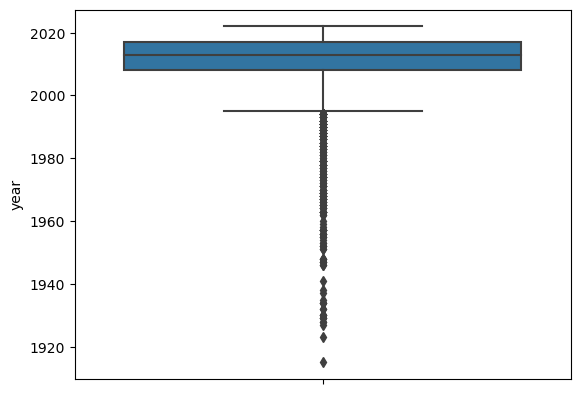

In [30]:
sns.boxplot(y=df_train['year']);

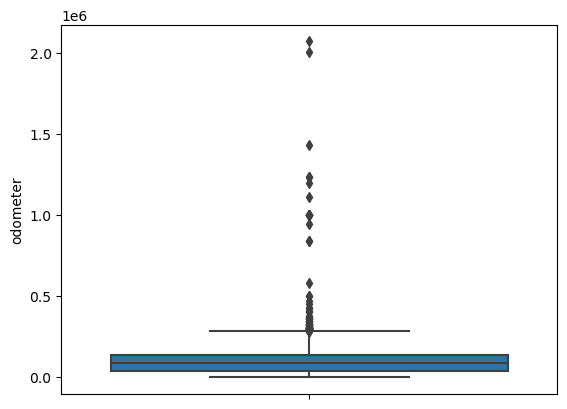

In [31]:
sns.boxplot(y=df_train['odometer']);

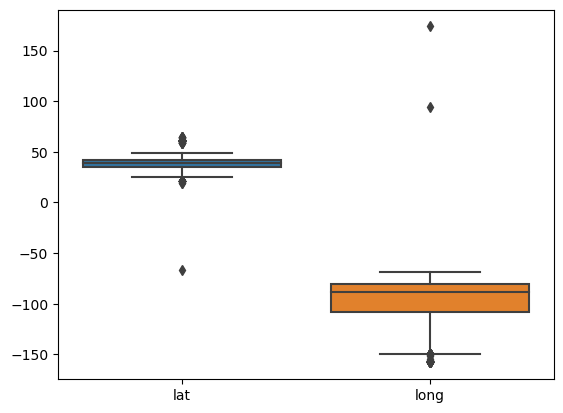

In [32]:
sns.boxplot(df_train[['lat', 'long']]);

Видим значительные выбросы в **odometer**, **year**, **lat** и **long**. Заменим все выбросы медианными значениями

In [33]:
df_train.loc[out.year, 'year'] = int(df_train.year.median())
df_train.loc[out.odometer, 'odometer'] = int(df_train.odometer.median())
df_train.loc[out.lat, 'lat'] = int(df_train.lat.median())
df_train.loc[out.long, 'long'] = int(df_train.long.median())
df_train.loc[out.age, 'age'] = int(df_train.age.median())

Теперь устраним выбросы в тестовом датасете

In [34]:
out = (df_test[num_columns] < boundaries.min()) | (df_test[num_columns] > boundaries.max())
out.sum()

year         93
odometer     12
lat          26
long         21
month         0
dayofweek     0
age          93
dtype: int64

In [35]:
df_test.loc[out.year, 'year'] = int(df_train.year.median())
df_test.loc[out.odometer, 'odometer'] = int(df_train.odometer.median())
df_test.loc[out.lat, 'lat'] = int(df_train.lat.median())
df_test.loc[out.long, 'long'] = int(df_train.long.median())
df_test.loc[out.age, 'age'] = int(df_train.age.median())

### 4.4 Создание новых признаков (Feature Engineering) <a class="anchor" id="4.4"></a>

[Наверх](#0)

Прежде чем приступить к преобразованию категориальных данных, посмотрим, сколько уникальных значений содержится в столбцах с категориальными данными

In [36]:
df_train[cat_columns].nunique().sort_values(ascending=False)

description       7832
model             2956
region             392
state               51
manufacturer        39
title_status         6
fuel                 5
transmission         3
price_category       3
dtype: int64

Как видно, в некоторых столбцах содержится огромное количество уникальных элементов. Исследуем, как количество символов в описании влияет на ценовую категорию

In [37]:
# Создадим новый признак
df_train['desc_len'] = df_train.apply(lambda x: len(x.description), axis=1)

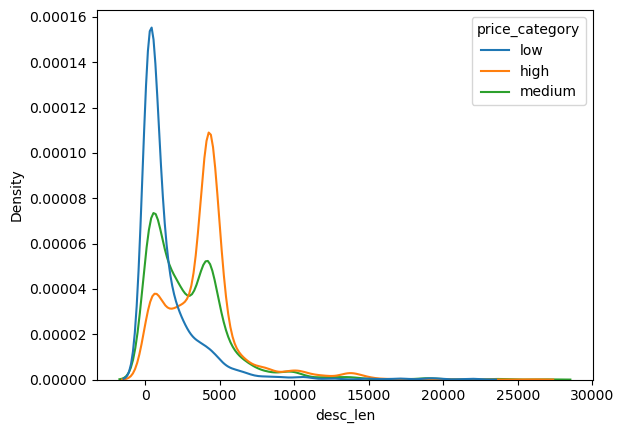

In [38]:
sns.kdeplot(x='desc_len', data=df_train, hue='price_category');

Как видно, для более дорогих автомобилей характерно более длинное описание

In [39]:
df_test['desc_len'] = df_test.apply(lambda x: len(x.description), axis=1)

Следующий параметр, который может влиять на стоимость автомобиля, это модель. Уникальных значений 3439. Такое количество для обучения тоже не подойдет. Уменьшим это количество за счёт того, что из описания оставим только первое слово.

In [40]:
# Создадим новую фичу
df_train['short_model'] = df_train.model.apply(lambda x: x.split()[0])
df_train.short_model.nunique()

869

Количество значений уменьшилось более чем в 3 раза!

In [41]:
df_test['short_model'] = df_test.model.apply(lambda x: x.split()[0])
df_test.short_model.nunique()

467

Удалим признаки **model** и **description**

In [42]:
df_train = df_train.drop(['model', 'description'], axis=1)
df_test = df_test.drop(['model', 'description'], axis=1)

In [43]:
X_train = df_train.drop('price_category', axis=1)
y_train = df_train.price_category.copy()

In [44]:
X_test = df_test.drop('price_category', axis=1)
y_test = df_test.price_category.copy()

Теперь приведём наши данные к нужному виду, чтобы можно их было использовать на следующем шаге. Для этого стандартизируем числовые признаки и закодируем категориальные

In [45]:
cat_columns = X_train.select_dtypes(object).columns.tolist()
cat_columns

['region',
 'manufacturer',
 'fuel',
 'title_status',
 'transmission',
 'state',
 'short_model']

In [46]:
num_columns = X_train.select_dtypes(exclude=object).columns.tolist()
num_columns

['year', 'odometer', 'lat', 'long', 'month', 'dayofweek', 'age', 'desc_len']

In [47]:
# Зададим преобразование
num_transformer = StandardScaler()
cat_transformer = OneHotEncoder(sparse=False, handle_unknown='ignore')

# Зададим предварительную обработку
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_columns),
        ('cat', cat_transformer, cat_columns)
    ])

Закодируем наши признаки

In [48]:
X_train_tf = preprocessor.fit_transform(X_train)
X_test_tf = preprocessor.transform(X_test)

In [49]:
# Имена преобразованных столбцов
names = preprocessor.get_feature_names_out()
names

array(['num__year', 'num__odometer', 'num__lat', ...,
       'cat__short_model_zephyr', 'cat__short_model_zx2',
       'cat__short_model_♿'], dtype=object)

In [50]:
# Присвоим столбцам названия и восстановим индексы
X_train_tf = pd.DataFrame(X_train_tf, columns=names, index=X_train.index)
X_train_tf.head()

,num__year,num__odometer,num__lat,num__long,num__month,num__dayofweek,num__age,num__desc_len,cat__region_SF bay area,cat__region_abilene,...,cat__short_model_xts,cat__short_model_xv,cat__short_model_yaris,cat__short_model_yukon,cat__short_model_z,cat__short_model_z3,cat__short_model_z4,cat__short_model_zephyr,cat__short_model_zx2,cat__short_model_♿
1492,-1.360828,1.287783,-0.104471,0.035222,1.629840,1.112122,1.360828,-0.844293,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1807,0.655920,-0.259854,0.873870,0.873593,-0.613557,-0.376667,-0.655920,-0.680987,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2644,0.655920,-1.276850,0.605501,0.589665,-0.613557,-0.376667,-0.655920,0.798866,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7054,-3.010895,0.797709,0.035795,1.072464,-0.613557,-0.376667,3.010895,-0.010096,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7258,0.105898,-0.153660,1.352960,-1.790312,-0.613557,-0.376667,-0.105898,0.658271,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
X_test_tf = pd.DataFrame(X_test_tf, columns=names, index=X_test.index)
X_test_tf.head()

,num__year,num__odometer,num__lat,num__long,num__month,num__dayofweek,num__age,num__desc_len,cat__region_SF bay area,cat__region_abilene,...,cat__short_model_xts,cat__short_model_xv,cat__short_model_yaris,cat__short_model_yukon,cat__short_model_z,cat__short_model_z3,cat__short_model_z4,cat__short_model_zephyr,cat__short_model_zx2,cat__short_model_♿
5329,-0.810806,0.250537,0.611578,1.353708,1.629840,-1.369194,0.810806,-0.839246,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
516,-0.994147,1.633532,1.585272,-1.656164,-0.613557,-1.369194,0.994147,-0.974434,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4378,-0.810806,1.209067,0.901085,0.557507,-0.613557,0.119596,0.810806,-0.569592,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8479,-0.077443,1.281444,-2.164628,0.786058,-0.613557,-0.376667,0.077443,-0.191067,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9141,0.472579,0.275974,-1.590793,0.710020,-0.613557,0.615859,-0.472579,-0.351490,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 5. Моделирование <a class="anchor" id="5"></a>

Инициализируем модели

In [52]:
lr = LogisticRegression(random_state=42)
rf = RandomForestClassifier(random_state=42)
mlp = MLPClassifier(random_state=42)

### 5.1 Логистическая регрессия <a class="anchor" id="5.1"></a>

[Наверх](#0)

In [53]:
# Выведем гиперпараметры
lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 42,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

Выполним кросс-валидацию на тренировочной выборке с параметрами по умолчанию

In [54]:
lr_cv_score = cross_val_score(lr, X_train_tf, y_train, cv=5)
lr_cv_score

array([0.75692695, 0.76511335, 0.7581864 , 0.7731569 , 0.76055451])

In [55]:
print(f'средняя оценка точности равна {lr_cv_score.mean()}\n'
      f'стандартное отклонение равно {lr_cv_score.std()}')

средняя оценка точности равна 0.7627876210837743
стандартное отклонение равно 0.005889591789167688


Попробуем улучшить нашу модель

In [56]:
# Параметры решетчатого поиска
#param_grid = {
#    'penalty' : ['l1','l2'],
#    'C': [1, 20, 50],
#    'solver': ['newton-cg', 'lbfgs', 'liblinear']
#}

# Поиск оптимальных параметров
#lr_grid_search = GridSearchCV(estimator=lr, param_grid=param_grid, cv=5)
#lr_grid_search.fit(X_train_tf, y_train)

In [57]:
# Выведем оптимальные значения гиперпараметров
#best_params = lr_grid_search.best_params_
#best_params

In [58]:
# Выведем лучшую оценку
#lr_grid_search.best_score_

Как видно, лучшая оценка равна 0.765

Инициализируем модель с оптимальными параметрами

In [59]:
#lr_tuned = lr_grid_search.best_estimator_
#lr_tuned.fit(X_train, y_train)

In [60]:
lr_tuned = LogisticRegression(C=20, random_state=42, solver='newton-cg')
lr_tuned.fit(X_train_tf, y_train)

LogisticRegression(C=20, random_state=42, solver='newton-cg')

In [61]:
# Точность модели на тренировочной и тестовой выборках
print(f'Точность на тренировочной выборке равна {lr_tuned.score(X_train_tf, y_train)}')
print(f'Точность на тестовой выборке равна {lr_tuned.score(X_test_tf, y_test)}')

Точность на тренировочной выборке равна 0.8799445704207609
Точность на тестовой выборке равна 0.7758186397984886


Визуализируем матрицу ошибок

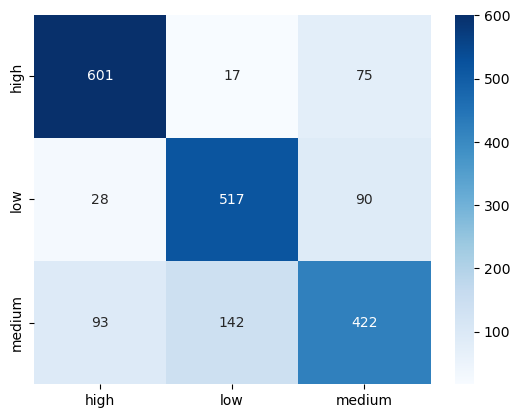

In [62]:
lr_matrix = pd.DataFrame(data=confusion_matrix(y_test, lr_tuned.predict(X_test_tf)), 
                         columns=lr_tuned.classes_, 
                         index=lr_tuned.classes_)

sns.heatmap(lr_matrix, annot=True, fmt='d', cmap='Blues');

Как видно, модель хуже всего предсказывает категорию цены medium

In [63]:
# Выведем значение коэффициентов
lr_feature_scores = pd.Series(abs(lr_tuned.coef_[0]), index=X_train_tf.columns).sort_values(ascending=False)
lr_feature_scores

cat__short_model_eurovan       1.044881e+01
cat__short_model_Peterbilt     8.376554e+00
cat__short_model_SPECIAL       7.295876e+00
cat__short_model_lx450         7.043510e+00
cat__short_model_g-class       6.850123e+00
                                   ...     
cat__short_model_cavalier      1.038582e-08
cat__short_model_e320          5.090030e-09
cat__short_model_roadmaster    4.504719e-09
cat__short_model_b-series      2.774948e-09
cat__short_model_g20           8.798944e-10
Length: 1373, dtype: float64

Визуализируем важность признаков

In [64]:
f, ax = plt.subplots(figsize=(30, 600))
ax = sns.barplot(x=lr_feature_scores, y=lr_feature_scores.index, data=df)
ax.set_title("Visualize feature scores of the features")
ax.set_yticklabels(lr_feature_scores.index)
ax.set_xlabel("Feature importance score")
ax.set_ylabel("Features")
ax.bar_label(ax.containers[0])
plt.show()

Попробуем теперь уменьшить количество фичей, убирая те, вклад которых меньше определенного значения

In [65]:
# Определим функцию
def lr_accuracy(model, X_train, X_test, y_train, y_test, step=0.1, limit=1.0):
    model.fit(X_train, y_train)
    feature_scores = list(zip(X_train.columns, model.coef_[0]))
    for i in np.arange(0, limit+step, step):
        cols = [col[0] for col in feature_scores if abs(col[1]) <= i]
        model.fit(X_train.drop(cols, axis=1), y_train)
        print(f'limit = {round(i, 1)} \t accuracy_train = {model.score(X_train.drop(cols, axis=1), y_train)}' \
              f' \t accuracy_test = {model.score(X_test.drop(cols, axis=1), y_test)}')

In [66]:
lr_accuracy(lr_tuned, X_train_tf, X_test_tf, y_train, y_test)

limit = 0.0 	 accuracy_train = 0.8799445704207609 	 accuracy_test = 0.7758186397984886
limit = 0.1 	 accuracy_train = 0.8745275888133031 	 accuracy_test = 0.7818639798488665
limit = 0.2 	 accuracy_train = 0.871756109851348 	 accuracy_test = 0.7798488664987405
limit = 0.3 	 accuracy_train = 0.8657092466616276 	 accuracy_test = 0.7738035264483627
limit = 0.4 	 accuracy_train = 0.86331569664903 	 accuracy_test = 0.7758186397984886
limit = 0.5 	 accuracy_train = 0.8591584782060973 	 accuracy_test = 0.7773299748110831
limit = 0.6 	 accuracy_train = 0.8547493071302595 	 accuracy_test = 0.7818639798488665
limit = 0.7 	 accuracy_train = 0.8514739229024944 	 accuracy_test = 0.7869017632241814
limit = 0.8 	 accuracy_train = 0.8499622071050642 	 accuracy_test = 0.7838790931989924
limit = 0.9 	 accuracy_train = 0.845175107079869 	 accuracy_test = 0.7858942065491183
limit = 1.0 	 accuracy_train = 0.8411438649533888 	 accuracy_test = 0.7828715365239295


Как видно, за счёт уменьшения количества фичей можно добиться незначительного повышения точности. В нашем случае до 0.787

### 5.2 Случайный лес <a class="anchor" id="5.2"></a>

[Наверх](#0)

In [67]:
# Выведем гиперпараметры
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

Выполним кросс-валидацию на тренировочной выборке с параметрами по умолчанию

In [68]:
rf_cv_score = cross_val_score(rf, X_train_tf, y_train, cv=5)
rf_cv_score

array([0.75692695, 0.76196474, 0.75314861, 0.76559546, 0.77063642])

In [69]:
print(f'средняя оценка точности равна {rf_cv_score.mean()}\n'
      f'стандартное отклонение равно {rf_cv_score.std()}')

средняя оценка точности равна 0.7616544372649947
стандартное отклонение равно 0.006180649398847215


Попробуем улучшить нашу модель

In [ ]:
# Параметры решетчатого поиска
#param_grid = {
#    'bootstrap' : [True, False],
##    'max_depth': [50, 100],
#    'max_features': ['sqrt', 'log2'],
#    'min_samples_leaf': [1, 2, 4],
#    'min_samples_split': [2, 3, 5],
#    'n_estimators': [50, 100]
#}

# Поиск оптимальных параметров
#rf_grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
#rf_grid_search.fit(X_train_tf, y_train)

In [ ]:
# Выведем оптимальные значения гиперпараметров
#best_params = rf_grid_search.best_params_
#best_params

In [ ]:
# Выведем лучшую оценку
#rf_grid_search.best_score_

Как видно, лучшая оценка равна 0.773

Инициализируем модель с оптимальными параметрами

In [ ]:
#rf_tuned = rf_grid_search.best_estimator_
#rf_tuned.fit(X_train, y_train)

In [70]:
# Инициализируем модель с оптимальными параметрами
rf_tuned = RandomForestClassifier(bootstrap=False, max_depth=100, min_samples_split=2,
                       random_state=42)
rf_tuned.fit(X_train_tf, y_train)

RandomForestClassifier(bootstrap=False, max_depth=100, random_state=42)

In [71]:
# Точность модели на тренировочной и тестовой выборках
print(f'Точность на тренировочной выборке равна {rf_tuned.score(X_train_tf, y_train)}')
print(f'Точность на тестовой выборке равна {rf_tuned.score(X_test_tf, y_test)}')

Точность на тренировочной выборке равна 1.0
Точность на тестовой выборке равна 0.7727959697732998


Визуализируем матрицу ошибок

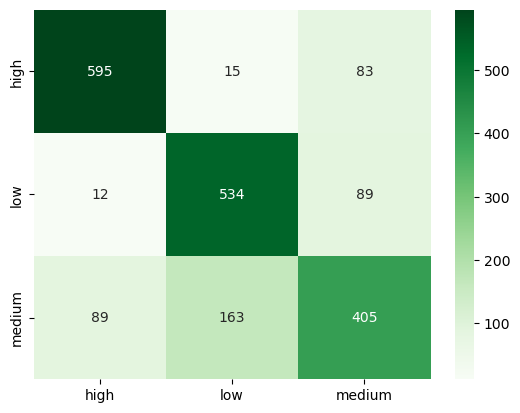

In [72]:
rf_matrix = pd.DataFrame(data=confusion_matrix(y_test, rf_tuned.predict(X_test_tf)), 
                         columns=rf_tuned.classes_, 
                         index=rf_tuned.classes_)

sns.heatmap(rf_matrix, annot=True, fmt='d', cmap='Greens');

Как видно, результаты на тестовой выборке сравнимы с результатом у логистической регрессии

In [73]:
# Выведем значение коэффициентов при фичах
rf_feature_scores = pd.Series(abs(rf_tuned.feature_importances_), index=X_train_tf.columns).sort_values(ascending=False)
rf_feature_scores

num__year                    1.009012e-01
num__age                     9.406833e-02
num__odometer                9.119056e-02
num__desc_len                7.676119e-02
num__long                    3.866405e-02
                                 ...     
cat__short_model_xc          2.255018e-08
cat__short_model_slc         2.187953e-08
cat__short_model_g35x        1.962670e-08
cat__region_owensboro        1.235632e-08
cat__short_model_cavalier    5.485261e-09
Length: 1373, dtype: float64

In [74]:
# Визуализируем важность фичей
f, ax = plt.subplots(figsize=(30, 600))
ax = sns.barplot(x=rf_feature_scores, y=rf_feature_scores.index, data=df)
ax.set_title("Visualize feature scores of the features")
ax.set_yticklabels(rf_feature_scores.index)
ax.set_xlabel("Feature importance score")
ax.set_ylabel("Features")
ax.bar_label(ax.containers[0])
plt.show()

### 5.3 Многослойный персептрон <a class="anchor" id="5.3"></a>

[Наверх](#0)

In [75]:
mlp.get_params()

{'activation': 'relu',
 'alpha': 0.0001,
 'batch_size': 'auto',
 'beta_1': 0.9,
 'beta_2': 0.999,
 'early_stopping': False,
 'epsilon': 1e-08,
 'hidden_layer_sizes': (100,),
 'learning_rate': 'constant',
 'learning_rate_init': 0.001,
 'max_fun': 15000,
 'max_iter': 200,
 'momentum': 0.9,
 'n_iter_no_change': 10,
 'nesterovs_momentum': True,
 'power_t': 0.5,
 'random_state': 42,
 'shuffle': True,
 'solver': 'adam',
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': False,
 'warm_start': False}

Выполним кросс-валидацию на тренировочной выборке с параметрами по умолчанию

In [76]:
mlp_cv_score = cross_val_score(mlp, X_train_tf, y_train, cv=5)
mlp_cv_score

array([0.76007557, 0.77518892, 0.75881612, 0.7794581 , 0.75299307])

In [77]:
print(f'средняя оценка точности равна {mlp_cv_score.mean()}\n'
      f'стандартное отклонение равно {mlp_cv_score.std()}')

средняя оценка точности равна 0.7653063540510985
стандартное отклонение равно 0.01018860281082988


Попробуем улучшить нашу модель

In [ ]:
# Параметры случайного поиска
#param_distribs = {
#    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
#    'activation': ['identity', 'logistic', 'tanh', 'relu'],
#    'solver': ['lbfgs', 'sgd', 'adam'],
#    'alpha': [0.0001, 0.05],
#    'learning_rate': ['constant', 'invscaling', 'adaptive']
#}

# Поиск оптимальных параметров
#mlp_rnd_search = RandomizedSearchCV(estimator=mlp, param_distributions=param_distribs, n_iter=30, cv=5)
#mlp_rnd_search.fit(X_train, y_train)

In [ ]:
#best_params = mlp_rnd_search.best_params_
#best_params

In [ ]:
#mlp_rnd_search.best_score_

Как видно, лучшая оценка равна 0.816

In [ ]:
# Инициализируем модель с оптимальными параметрами
#mlp_tuned = mlp_rnd_search.best_estimator_
#mlp_tuned.fit(X_train, y_train)

Инициализируем модель с оптимальными параметрами

In [78]:
mlp_tuned = MLPClassifier(activation='logistic', alpha=0.05,
              hidden_layer_sizes=(50, 50, 50), learning_rate='invscaling',
              random_state=42)
mlp_tuned.fit(X_train_tf, y_train)

MLPClassifier(activation='logistic', alpha=0.05,
              hidden_layer_sizes=(50, 50, 50), learning_rate='invscaling',
              random_state=42)

In [79]:
# Точность модели на тренировочной и тестовой выборках
print(f'Точность на тренировочной выборке равна {mlp_tuned.score(X_train_tf, y_train)}')
print(f'Точность на тестовой выборке равна {mlp_tuned.score(X_test_tf, y_test)}')

Точность на тренировочной выборке равна 0.8964474678760394
Точность на тестовой выборке равна 0.7964735516372796


Визуализируем матрицу ошибок

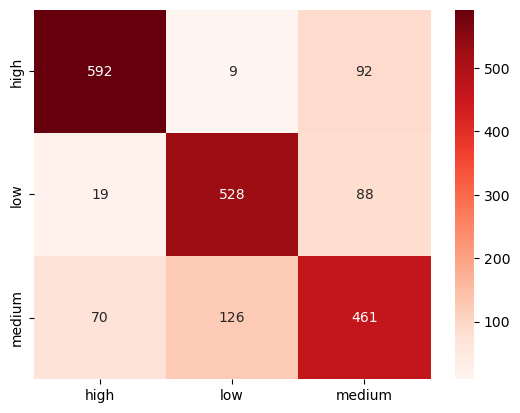

In [80]:
mlp_matrix = pd.DataFrame(data=confusion_matrix(y_test, mlp_tuned.predict(X_test_tf)), 
                         columns=mlp_tuned.classes_, 
                         index=mlp_tuned.classes_)

sns.heatmap(mlp_matrix, annot=True, fmt='d', cmap='Reds');

Как видно, улучшилось качество предсказания по категории цены medium, и, как следствие, улучшилось качество предсказания по сравнению с предыдущими моделями

## 6. Заключение <a class="anchor" id="6"></a>

[Наверх](#0)

Таким образом, можно сделать вывод, что многослойный персептрон показал себя лучше других моделей для предсказания ценовой категории автомобиля. На втором месте по точности предсказания оказалась логистическая регрессия